### This notebook is used to pre-process E15.5 dataset. 

After running the scrublet-based doublet checking, two genes 'Gm42418', 'AY036118' are removed by following some published papers, e.g. https://journals.plos.org/plospathogens/article?id=10.1371/journal.ppat.1010026. These genes were identified as markers in a cluster if not removed. 

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings("ignore")

import datetime
today = datetime.date.today()
today = today.strftime('%m%d%Y')

import scanpy as sc
import scrublet as scr
import pandas as pd
import PlotGenerators as helper
from scpy4reactome import scanpy_wrapper as scw
from scpy4reactome import pathway_analyzer as pa
import importlib
importlib.reload(pa)


# The parent directory for the E15.5 data. This is hard-coded.
DIR_NAME = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/'
REACTOME_GMT_FILE = '../resources/MouseReactomePathways_Rel_75_122220.gmt'

AnnData object with n_obs × n_vars = 7335 × 32285
    var: 'gene_ids', 'feature_types', 'genome'
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.57
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 1.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 14.1%
Elapsed time: 13.2 seconds
AnnData object with n_obs × n_vars = 7307 × 19513
    obs: 'scrublet_doublet_score', 'scrublet_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'


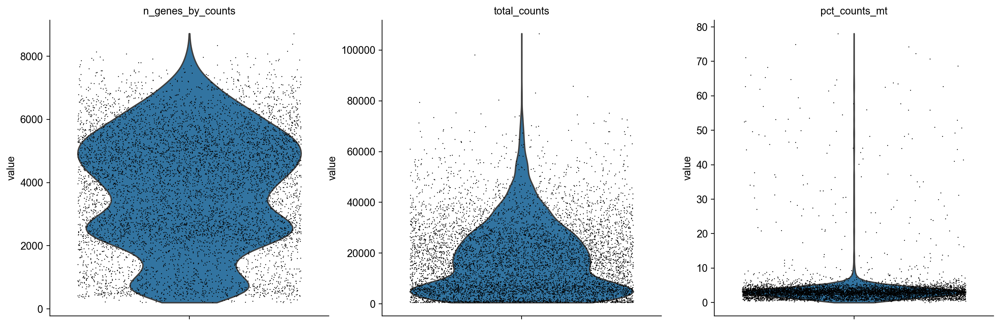

In [14]:
# Pre-process
out_file_15_5 = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/aligned_outs/filtered_feature_bc_matrix.h5'
adata_15_5_raw = sc.read_10x_h5(out_file_15_5)
adata_15_5_raw.var_names_make_unique()
print(adata_15_5_raw)

# Make a copy of the raw count matrix so that the wrapper's preprocess can be used still
scrub = scr.Scrublet(adata_15_5_raw.X.copy())
doublet_scores, predicted_doublets = scrub.scrub_doublets()
adata_15_5_raw.obs['scrublet_doublet_score'] = doublet_scores
adata_15_5_raw.obs['scrublet_doublet'] = pd.Categorical(predicted_doublets)

# Before do anything, check doublet
# Remove these two genes as described in some published papers, e.g. 
# genes_to_be_removed = ['Gm42418', 'AY036118']
# adata_15_5_raw = adata_15_5_raw[:, ~adata_15_5_raw.var_names.isin(genes_to_be_removed)]
scw.preprocess(adata_15_5_raw)
print(adata_15_5_raw)
sc.pl.violin(adata_15_5_raw, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [15]:
# Remove cells have pct_count_mt > 20% and doublets
doublet_cells = adata_15_5_raw.obs['scrublet_doublet'] == True
print('Before removing doublets: {}'.format(adata_15_5_raw))
adata_15_5_raw = adata_15_5_raw[~doublet_cells]
print('After doublets removed: {}'.format(adata_15_5_raw))
low_mt_cells = adata_15_5_raw.obs['pct_counts_mt'] < 20
adata_15_5_raw = adata_15_5_raw[low_mt_cells]
print('After remove cells having pct_counts_mt >= 20%: {}'.format(adata_15_5_raw))

Before removing doublets: AnnData object with n_obs × n_vars = 7307 × 19513
    obs: 'scrublet_doublet_score', 'scrublet_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
After doublets removed: View of AnnData object with n_obs × n_vars = 7296 × 19513
    obs: 'scrublet_doublet_score', 'scrublet_doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
After remove cells having pct_counts_mt >= 20%: View of AnnData object with n_obs × n_vars = 7166 × 19513
    

In [16]:
# Doing clusters
scw.cluster(adata_15_5_raw)

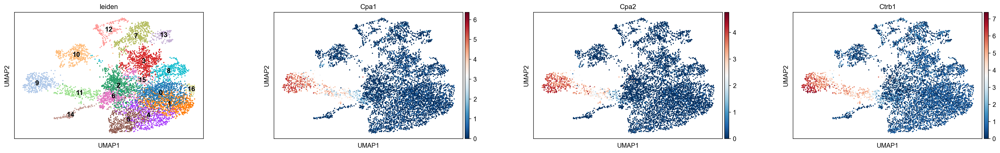

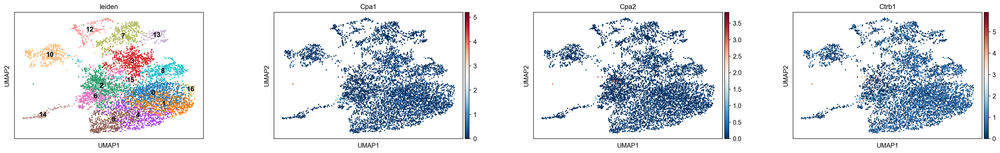

In [17]:
# color_keys = ['leiden', 'Cpa1', 'Cpa2', 'Ctrb1', 'Gm42418', 'AY036118']
color_keys = ['leiden', 'Cpa1', 'Cpa2', 'Ctrb1']
sc.pl.umap(adata_15_5_raw, color=color_keys, wspace=0.25, legend_loc='on data')
# Cells in clusters 8 and 12 to be removed
adata_15_5_raw_cpa_clusters_removed = adata_15_5_raw[~adata_15_5_raw.obs['leiden'].isin(['9', '11'])]
sc.pl.umap(adata_15_5_raw_cpa_clusters_removed, color=color_keys, wspace=0.25, legend_loc='on data')


leiden resolution: 0.4


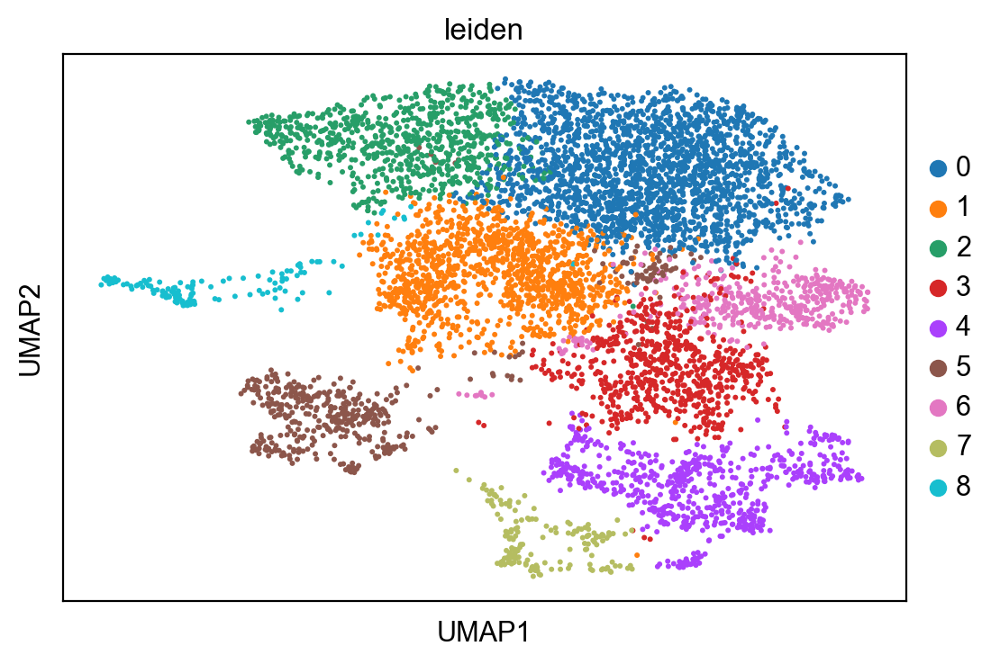

leiden
0    2123
1    1176
2     763
3     677
4     621
5     455
6     411
7     158
8     129
Name: leiden, dtype: int64

leiden resolution: 0.5


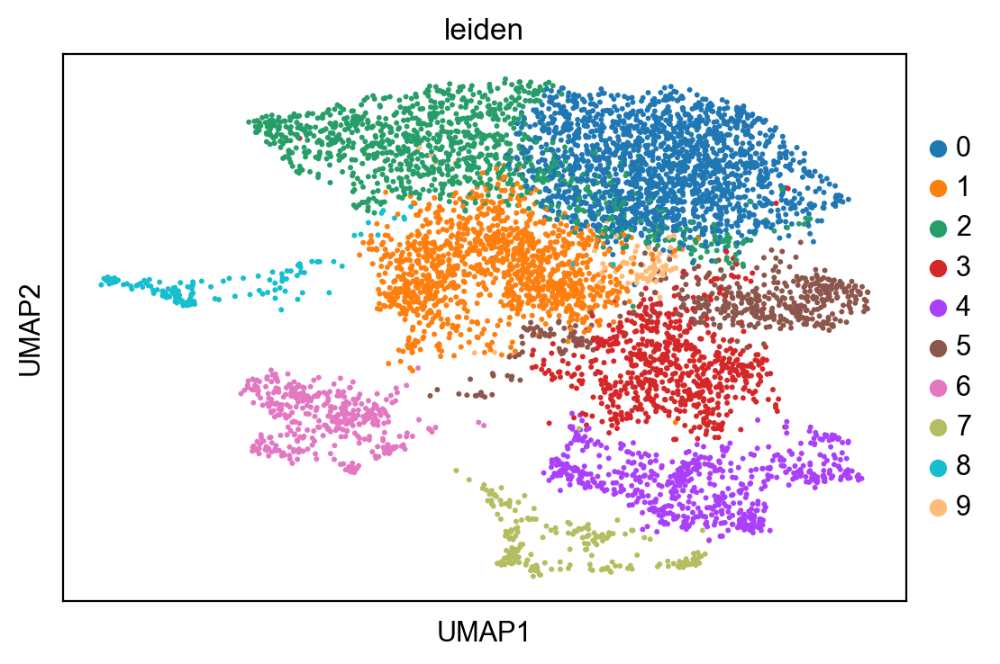

leiden
0    1731
1    1206
2    1086
3     678
4     590
5     454
6     370
7     194
8     130
9      74
Name: leiden, dtype: int64

leiden resolution: 0.6


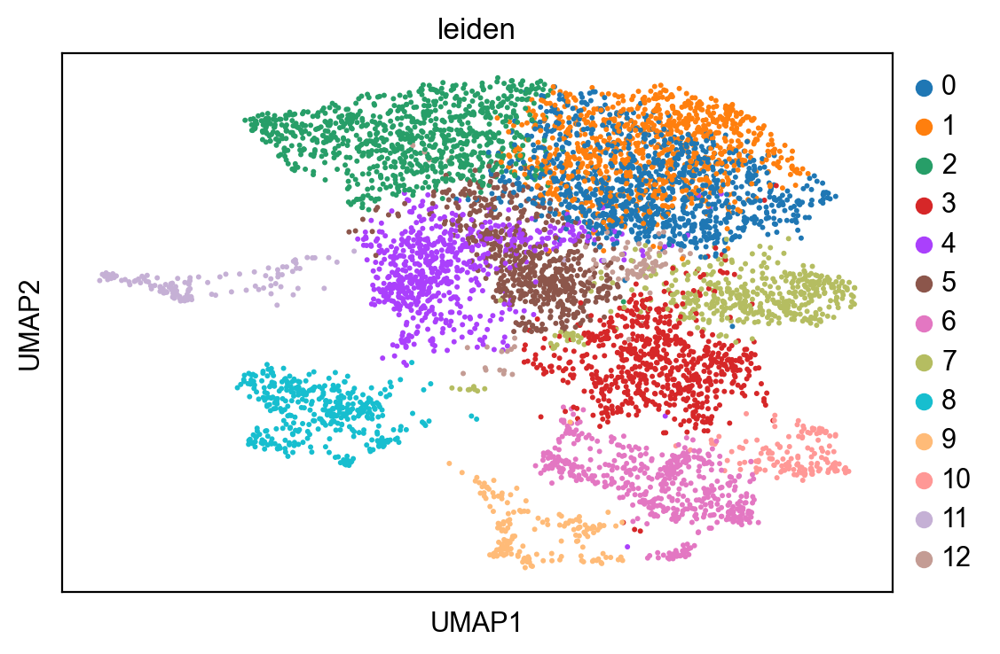

leiden
0     1066
1      869
2      844
3      672
4      667
5      599
6      479
7      430
8      372
9      159
10     143
11     121
12      92
Name: leiden, dtype: int64

leiden resolution: 0.7


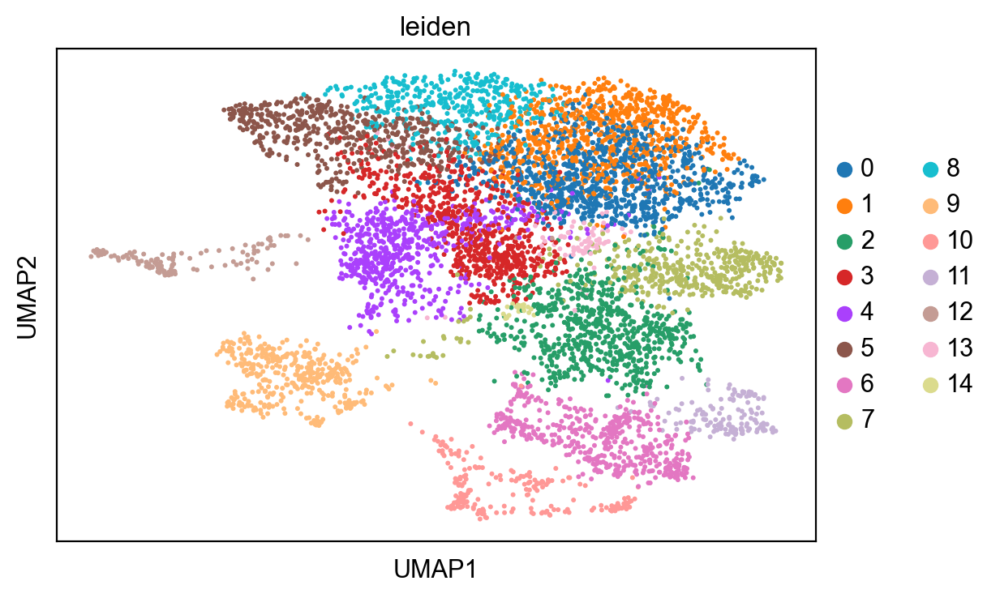

leiden
0     969
1     809
2     690
3     672
4     624
5     530
6     450
7     420
8     419
9     370
10    194
11    143
12    120
13     80
14     23
Name: leiden, dtype: int64

leiden resolution: 0.8


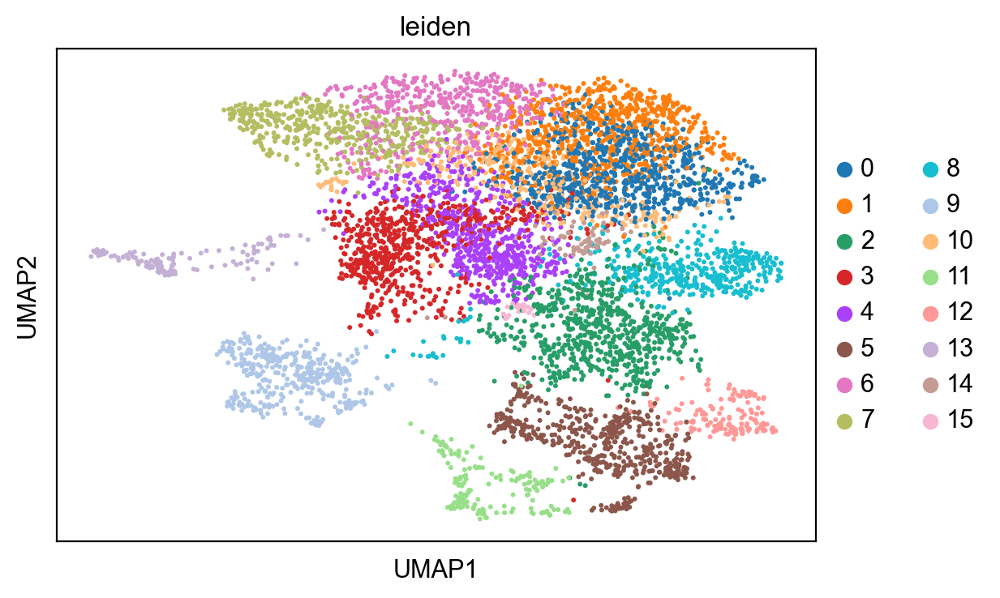

leiden
0     783
1     753
2     689
3     642
4     609
5     481
6     468
7     438
8     411
9     370
10    342
11    159
12    144
13    121
14     80
15     23
Name: leiden, dtype: int64

leiden resolution: 0.9


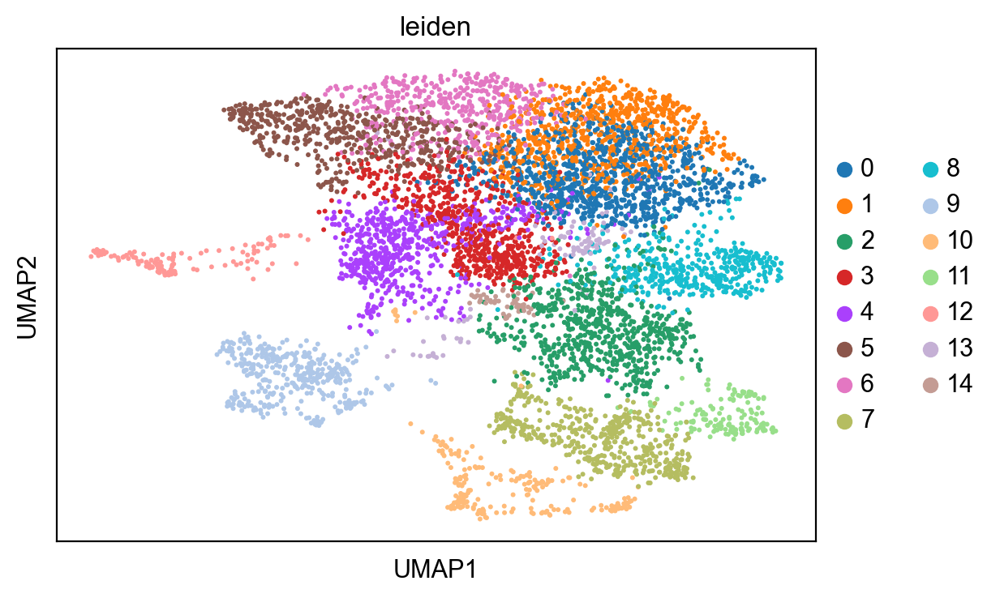

leiden
0     973
1     773
2     686
3     628
4     617
5     532
6     448
7     448
8     412
9     370
10    201
11    144
12    120
13    106
14     55
Name: leiden, dtype: int64

leiden resolution: 1.0


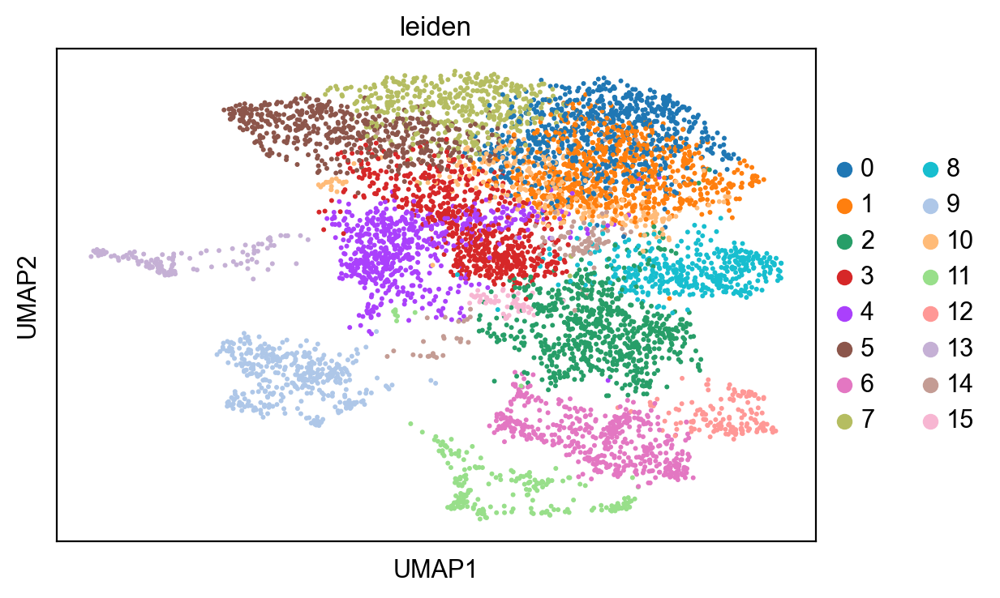

leiden
0     765
1     754
2     685
3     636
4     615
5     506
6     447
7     430
8     391
9     370
10    285
11    201
12    145
13    120
14    108
15     55
Name: leiden, dtype: int64


In [18]:
# %%script false --no-raise-error # Run the following code to figure out what is the best ledein resolution. 
# The found resolution should be used in the above cell.
# Try to figure out the best leiden resolution. To do this, use helper.run_umap() directly
# without using paga init since different resolutions result in different clusters with
# different init, causing the difficult to do comparison.
sc.pp.highly_variable_genes(adata_15_5_raw_cpa_clusters_removed)
for resolution in [0.4, 0.5, 0.6,  0.7, 0.8, 0.9, 1.0]:
    print('\nleiden resolution: {}'.format(resolution))
    # helper.run_umap_via_paga(adata=adata_15_5_raw, leiden_resolution=resolution)
    helper.run_umap(adata_15_5_raw_cpa_clusters_removed, leiden_resolution=resolution)
    # sc.pl.umap(adata_15_5_raw, color=['leiden'], legend_loc='on data')
    sc.pl.umap(adata_15_5_raw_cpa_clusters_removed, color=['leiden'])
    # print out the numbers
    print(adata_15_5_raw_cpa_clusters_removed.obs.groupby(by='leiden')['leiden'].count())

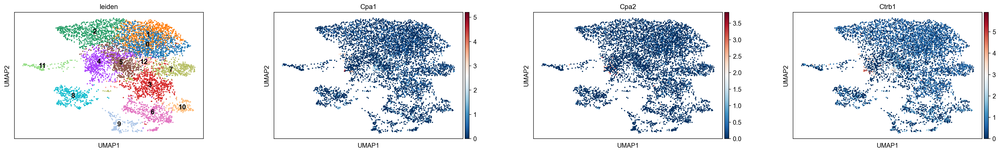

In [19]:
# Re-clustering after remove two pancreatic cancers
adata_e15 = adata_15_5_raw_cpa_clusters_removed
# Need to re-run highly variable genes
# Use this function as it is used in other two datasets (E12.5 and E15.5)
resolution = 0.6
helper.run_umap(adata=adata_e15, leiden_resolution=resolution)
helper.run_paga(adata_e15)
sc.pl.umap(adata_e15, color=color_keys, wspace=0.25, legend_loc='on data')

In [20]:
# Dump the analyzed data
filename = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/processed_filtered_pan_cells_{}.h5ad'.format(today)
sc.write(filename, adata_e15)

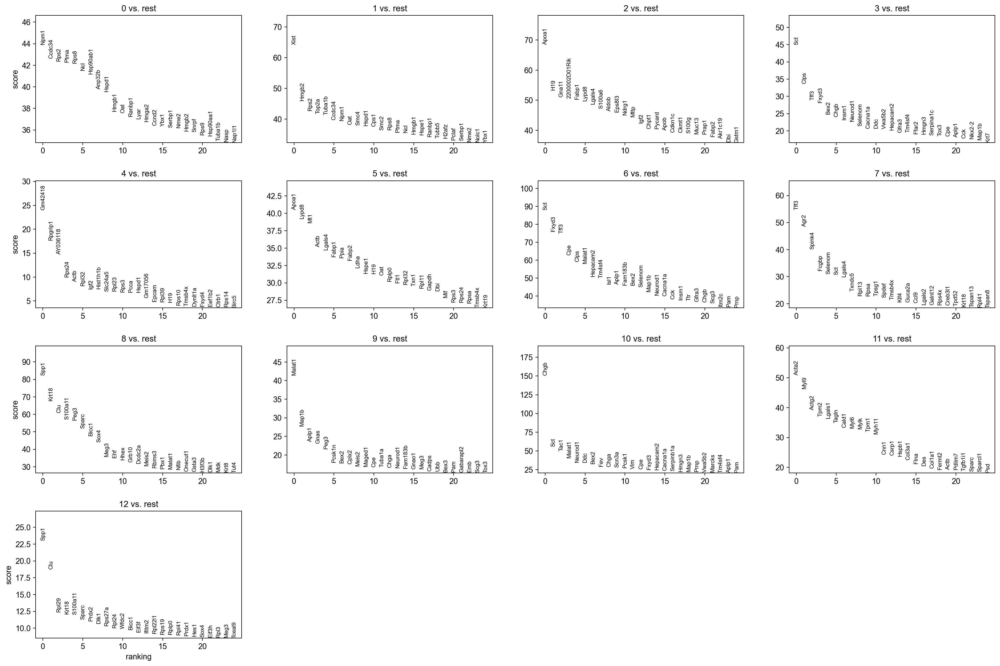

(20333, 6)
group
4       16
5      319
12     433
7      632
3     1024
11    1278
0     1958
1     2016
9     2090
2     2166
10    2191
8     2907
6     3303
Name: names, dtype: int64


In [21]:
# Run markers analysis for E15.5 data only as required by Missy and Nicole
save_plot = '_E15.5_{}.pdf'.format(today)
save_markers = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/07232023_Remove_Pan_Cells/markers_E15.5_{}.csv'.format(today)
# save_plot = None
# save_markers = None
# To make it work, we need to remove log1p key in uns. Not sure when this is added.
if 'log1p' in adata_e15.uns.keys():
    del adata_e15.uns['log1p']
helper.analyze_markers(adata_e15, save_plot, save_markers)

processing: 14.438098907470703
markov: 3.3157730102539062
gcs: 0.976926326751709
fnnls
regression: 10.228947877883911
diffusion:0.5453200340270996 
genes:0.9118318557739258


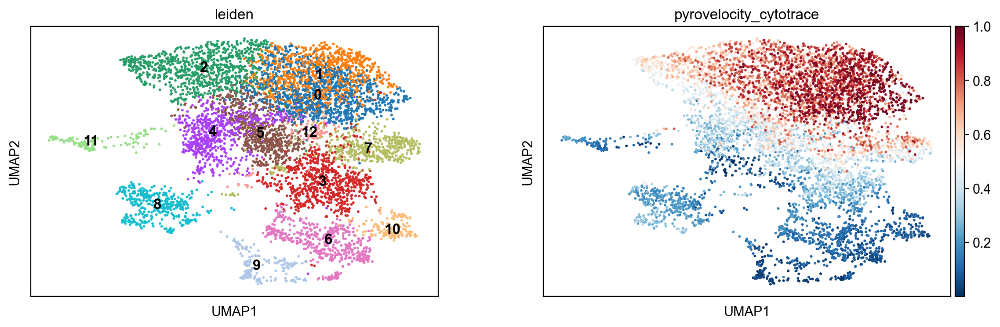

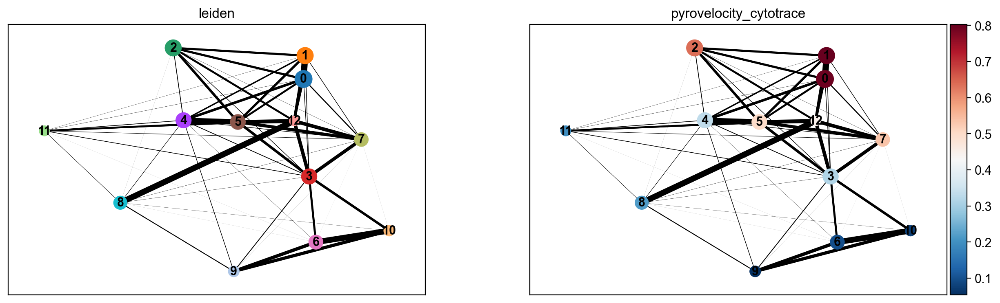

In [22]:
# For some reason, cytotrace cannot be saved into h5ad. Therefore, run it after saving. Luckily it runs very fast.
helper.run_cytotrace(adata_e15)
sc.pl.umap(adata_e15, color=['leiden', 'pyrovelocity_cytotrace'], legend_loc='on data', save='_e15.5_cytotrace_{}.pdf'.format(today))
sc.pl.paga(adata_e15, pos=adata_e15.uns['paga']['pos'], threshold=0, save='_e15.5_cytotrace_paga_{}.pdf'.format(today), color=['leiden', 'pyrovelocity_cytotrace'])

In [23]:
# %%script false --no-raise-error # Escape this cell when running the whole notebook. This cell needs to be run only once.
# Perform Pathway Analysis for E15.5
# Note: This frozen file may be different from the file used for pathway plot. Check it first.
# This cell should be run only once.
filename = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/processed_filtered_pan_cells_{}.h5ad'.format(today)
adata = sc.read_h5ad(filename)
# pa_result = pa.reactome_aucell(adata, Reactome_GMT_File)
# Apparently the original pathway results for E12.5 and E17.5 are not scaled. The new version of pathway_analyser
# uses scaling. To keep with the old results, therefore, use the code there to not scale.
aucell_wrapper = pa.AUCellWrapper()
aucell_wrapper.aucell(adata,
                      REACTOME_GMT_FILE,
                      pa.AUCELL_KEY,
                      filter_with_max_score=1.0E-4, # Default with 0.0001,
                      need_plot=False,
                      need_scale=False)
# Save the result into a new h5ad file so that there is no need to re-calculate it though it is not that slow.
adata_file_name = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/processed_filtered_pan_cells_{}_pathway_{}.h5ad'.format(today, today)
adata.write_h5ad(adata_file_name)
del adata

Less than 80% of the genes in 5-Phosphoribose 1-diphosphate biosynthesis are present in the expression matrix.
Less than 80% of the genes in Eicosanoids are present in the expression matrix.
Less than 80% of the genes in ABO blood group biosynthesis are present in the expression matrix.
Less than 80% of the genes in Acetylation are present in the expression matrix.
Less than 80% of the genes in Acetylcholine binding and downstream events are present in the expression matrix.
Less than 80% of the genes in Acrosome Reaction and Sperm:Oocyte Membrane Binding are present in the expression matrix.
Less than 80% of the genes in Activated NTRK2 signals through PLCG1 are present in the expression matrix.
Less than 80% of the genes in Activated PKN1 stimulates transcription of AR (androgen receptor) regulated genes KLK2 and KLK3 are present in the expression matrix.
Less than 80% of the genes in Activation of AMPA receptors are present in the expression matrix.
Less than 80% of the genes in Act

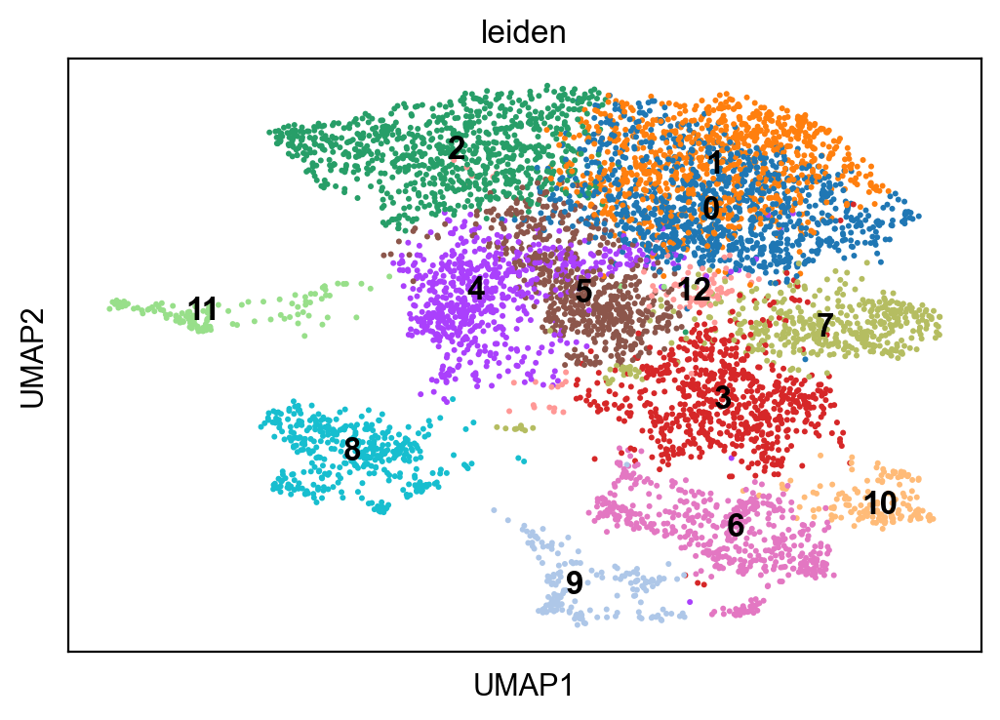

2023-10-02 17:45:37.848112: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


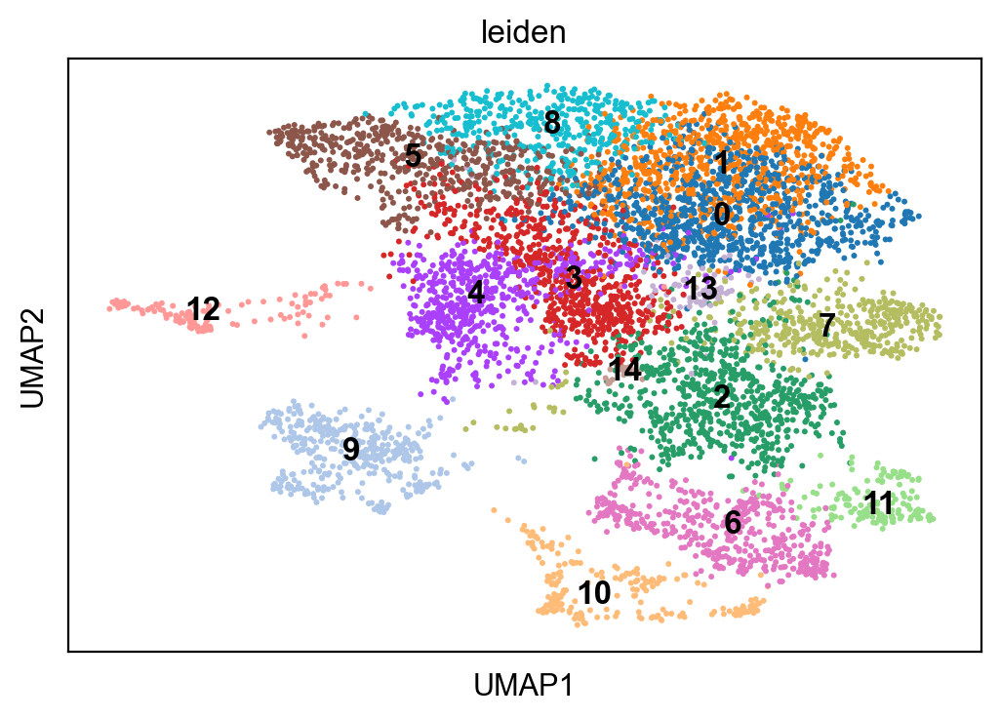

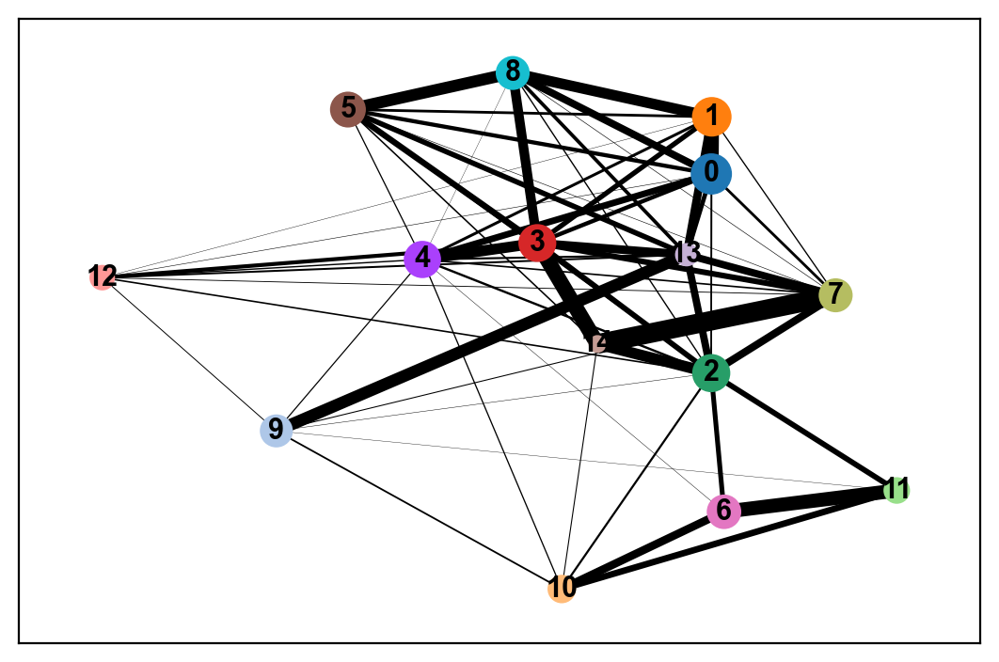

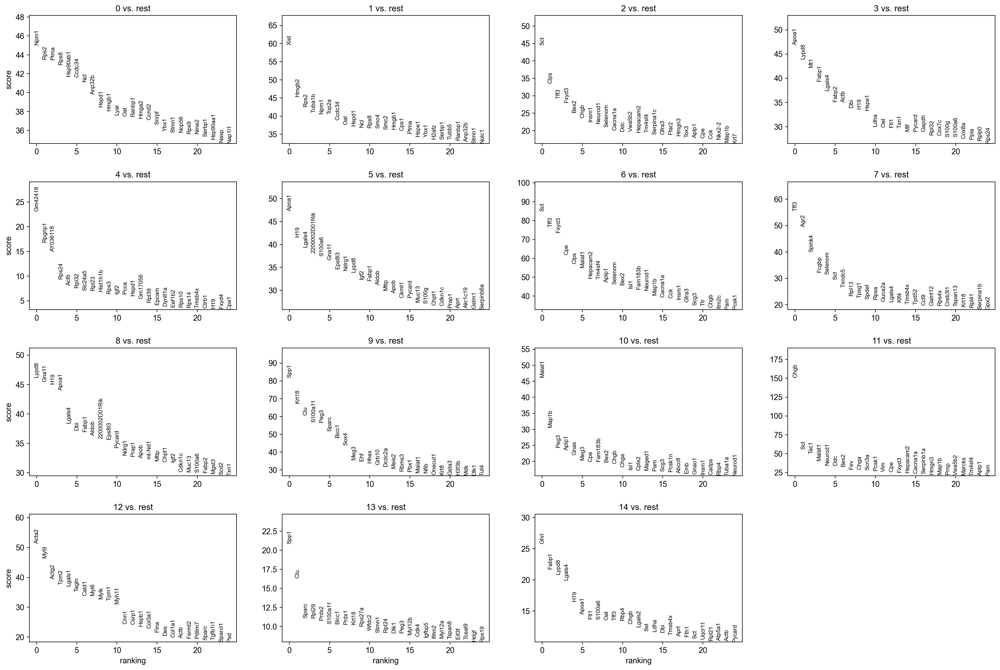

(22826, 6)
group
4       14
14     280
3      359
13     512
7      654
2      941
12    1290
5     1840
0     1885
1     1989
11    2191
10    2278
8     2472
9     2909
6     3212
Name: names, dtype: int64


In [8]:
# As of October 2, 2023, it is decided to use leiden resolution = 0.7 for E15.5 data. Therefore run this cell to do a fix
old_file = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/processed_filtered_pan_cells_09212023_pathway_09212023.h5ad'
new_file = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/processed_filtered_pan_cells_{}_pathway_{}.h5ad'.format(today, today)

adata = sc.read_h5ad(old_file)
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# Re-cluster E15 using resolution 0.7
sc.tl.leiden(adata, resolution=0.7, random_state=helper.random_state)
helper.run_paga(adata)
sc.pl.umap(adata, color='leiden', legend_loc='on data')
sc.pl.paga(adata, color='leiden', pos=adata.uns['paga']['pos'])

# Run markers analysis for E15.5 data only as required by Missy and Nicole
save_plot = '_E15.5_{}.pdf'.format(today)
save_markers = '/Volumes/ssd/results/missy_sc_rna/bmi1/E15.5/07232023_Remove_Pan_Cells/markers_E15.5_{}.csv'.format(today)
# save_plot = None
# save_markers = None
# To make it work, we need to remove log1p key in uns. Not sure when this is added.
if 'log1p' in adata.uns.keys():
    del adata.uns['log1p']
helper.analyze_markers(adata, save_plot, save_markers)

adata.write(new_file)
# Dump the results